In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

In [2]:
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [3]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [4]:
import os
import pathlib

In [6]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
category_index

{1: {'id': 1, 'name': 'gate'},
 2: {'id': 2, 'name': 'red_flare'},
 3: {'id': 3, 'name': 'yellow_flare'},
 4: {'id': 4, 'name': 'mat'},
 5: {'id': 5, 'name': 'red_bowl'},
 6: {'id': 6, 'name': 'blue_bowl'}}

In [20]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('test_images/')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('test_images/0.jpg'),
 PosixPath('test_images/104.jpg'),
 PosixPath('test_images/11.jpg'),
 PosixPath('test_images/24.jpg'),
 PosixPath('test_images/36.jpg'),
 PosixPath('test_images/73.jpg'),
 PosixPath('test_images/76.jpg'),
 PosixPath('test_images/86.jpg'),
 PosixPath('test_images/9.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 18-42-39.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 18-45-04.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 18-45-32.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-38-19.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-38-32.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-38-46.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-44-46.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-45-01.jpg'),
 PosixPath('test_images/Screenshot from 2020-08-19 19-45-10.jpg'),
 PosixPath('test_images/hydro_1_423.jpg'),
 PosixPath('test_images/hydro_1_442.jpg'),
 Posix

In [11]:
model_dir = 'graph_ssd_v2_tf1/'
PATH_TO_CKPT = os.path.join(model_dir,'frozen_inference_graph.pb')
PATH_TO_CKPT

'graph_ssd_v2_tf1/frozen_inference_graph.pb'

In [12]:
# Load a (frozen) Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.compat.v1.GraphDef()
    with tf.io.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [13]:
def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

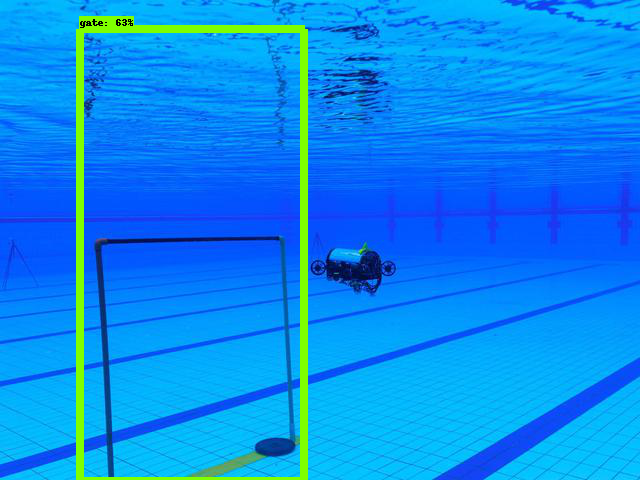

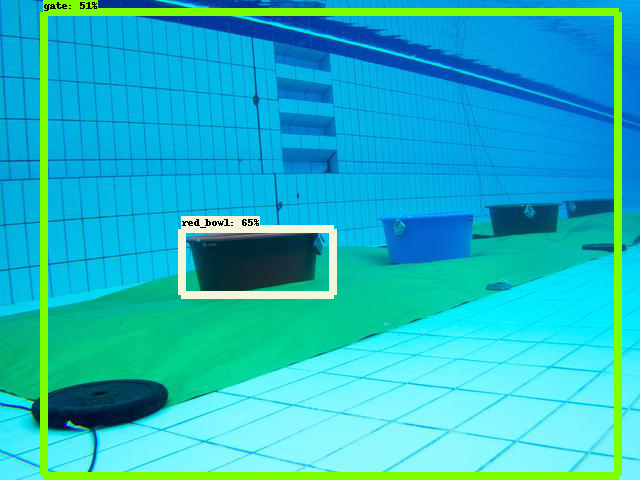

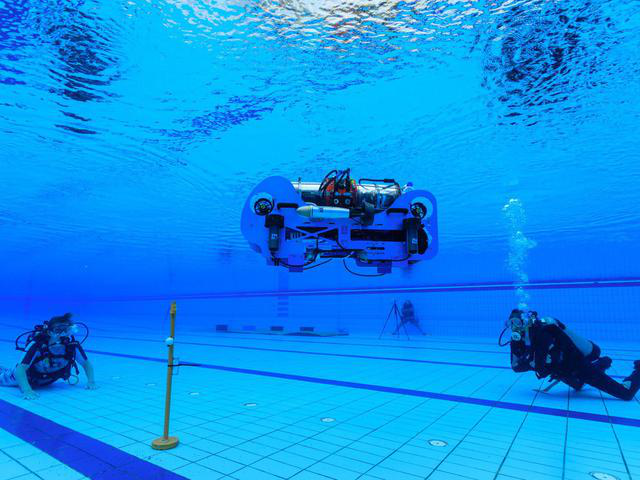

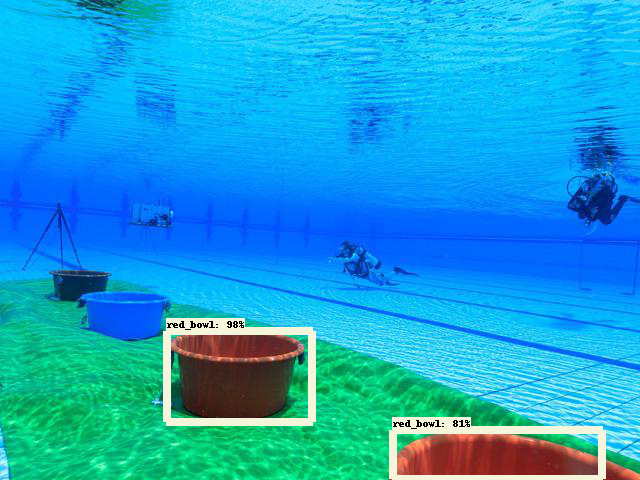

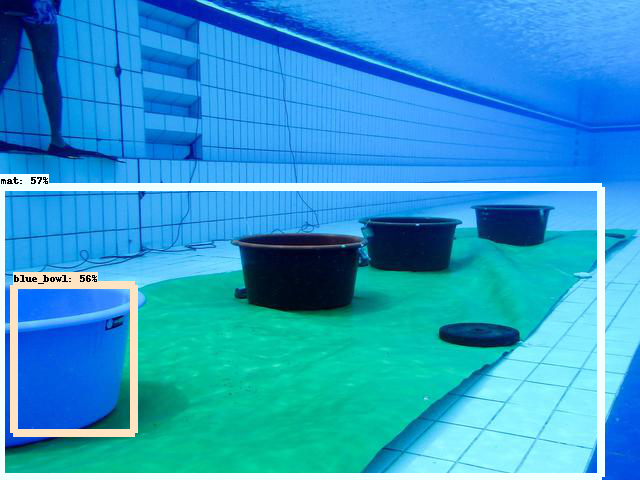

...

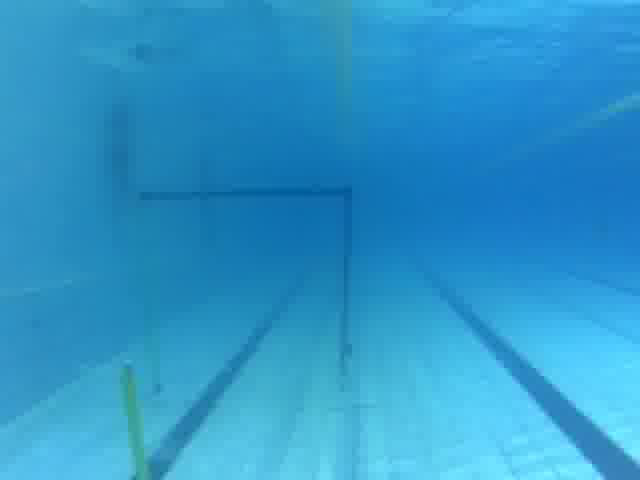

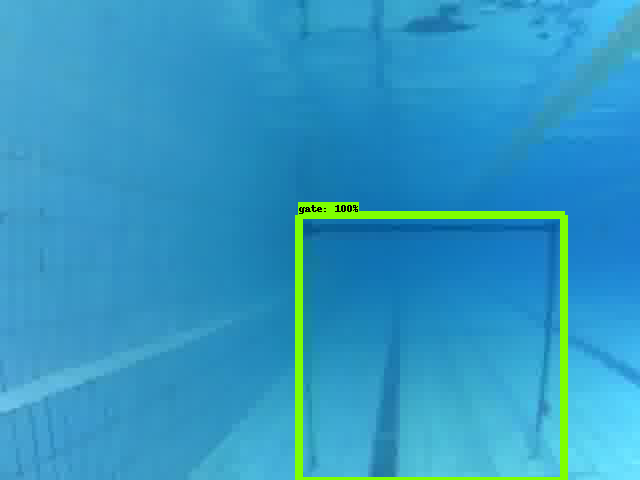

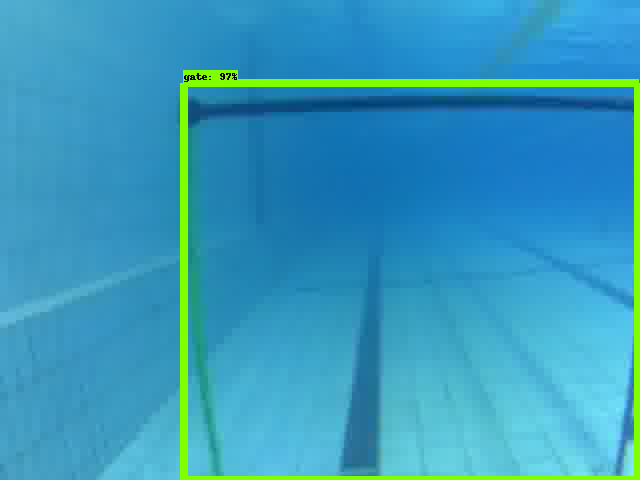

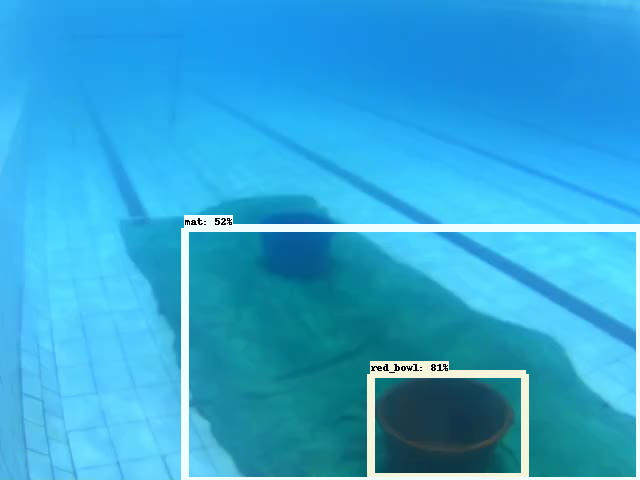

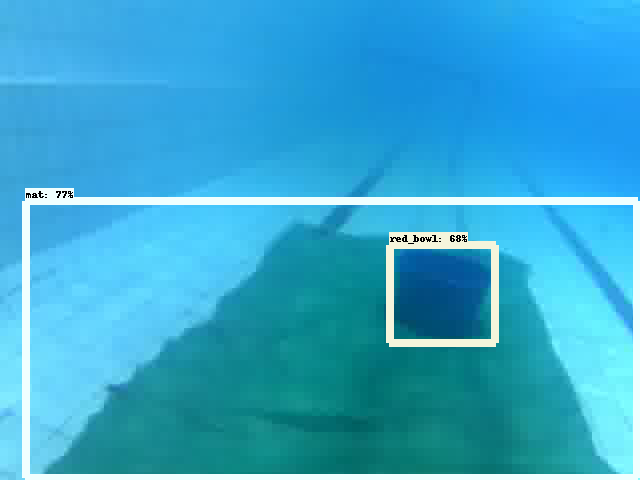

In [21]:
# Detection
with detection_graph.as_default():
    with tf.compat.v1.Session(graph=detection_graph) as sess:
        for image_path in TEST_IMAGE_PATHS:
            image_np = np.array(Image.open(image_path))
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)
            # Extract image tensor
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Extract detection boxes
            boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Extract detection scores
            scores = detection_graph.get_tensor_by_name('detection_scores:0')
            # Extract detection classes
            classes = detection_graph.get_tensor_by_name('detection_classes:0')
            # Extract number of detectionsd
            num_detections = detection_graph.get_tensor_by_name(
                'num_detections:0')
            # Actual detection.
            (boxes, scores, classes, num_detections) = sess.run(
                [boxes, scores, classes, num_detections],
                feed_dict={image_tensor: image_np_expanded})
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=8)
            display(Image.fromarray(image_np))